# App Rating Predictor
## Building an app rating predictor using data scraped from the android market
### We have scraped some apps from the Google PlayStore, and the primary goals of our project are:
- predict the rating
- predict installation count
- predict whether the app is free or paid 
- predict whether is it ad-supported

But before we start with the explanatory data analysis, we need to do data cleaning/preprocessing because our dataset is VERY UNSTRUCTURED and RAW.

# Table of contents
1. [EDA](#EDA) 
    1. <a href='#rating EDA'>RATING EDA</a> 
    2. <a href='#installs EDA'>INSTALLS EDA</a> 
    3. <a href='#miscellaneous EDA'>MISCELLANEOUS EDA</a>
        1. <a href='#price EDA'>Price EDA</a>
        2. <a href='#category EDA'>Category EDA</a>
        3. <a href='#size EDA'>Size EDA</a>
        4. <a href='#content rating EDA'>Content Rating EDA</a>
2. <a href='#singapore EDA'>Singapore EDA</a>
3. <a href='#fang EDA'>FANG EDA</a>
4. <a href='#geospatial analysis'>Geospatial Analysis</a>

### Import packages

In [1]:
import pandas as pd
import numpy as np
import datetime as dt
import seaborn as sb
sb.set_theme(style="white", palette=None)
pd.set_option("display.max_columns", None) #Show all columns, or else some will just be "..."

import plotly.express as px # shows basic statistics of the figure
from dython import nominal # Use for calculating correlation between variables. Including between categorical and numerical variables
import matplotlib.pyplot as plt # we only need pyplot

import plotly.graph_objects as go # Used as trace for subplots
from plotly.subplots import make_subplots

In [2]:
df = pd.read_csv("./datasets/google_app_scrap_cleaned.csv")
df.head()

,APP_NAME,RATING,CATEGORY,RATING_COUNT,1_STAR_RATINGS,2_STAR_RATINGS,3_STAR_RATINGS,4_STAR_RATINGS,5_STAR_RATINGS,REVIEW_COUNT,INSTALLS,MAX_INSTALLS,FREE,PRICE,SIZE,DEVELOPER,DEVELOPER_ADDRESS,COUNTRY,CONTENT_RATING,AD_SUPPORTED,IN_APP_PURCHASES,EDITORS_CHOICE,DAYS_SINCE_UPDATE,DAYS_SINCE_RELEASED
0,"""Ghost Voice Catcher"" AUTO EVP",3.933333,Lifestyle,68,12,1,6,7,42,24.0,"1,000+",3608,False,5.99,1100000.0,BIG BEARD Studios,114 1/2 Ash st. Nashua NH 03060,Usa,Everyone,False,False,False,1820.0,3482.0
1,"""OXXO""",4.740000,Puzzle,975,23,0,15,94,843,54.0,"10,000+",21680,False,0.99,81000000.0,Hamster On Coke Games,ul Jugosłowiańska 37F/10\n73-110 Stargard Szcz...,NaN,Everyone,False,False,False,0.0,945.0
2,#DRIVE,4.434152,Racing,229679,9352,4740,15249,47804,152534,6473.0,"5,000,000+",9119244,True,0.00,132000000.0,Pixel Perfect Dude S.A.,ul. Polna 28/6 lok. 4\n62-800 Kalisz\nPolska,NaN,Everyone,True,True,False,4.0,1084.0
3,#SelfCare,4.463476,Role Playing,14932,865,336,1088,1353,11290,1501.0,"1,000,000+",1209692,True,0.00,83000000.0,TRU LUV Inc.,"186-720 King Street West\nToronto, Ontario, Ca...",NaN,Teen,False,True,False,952.0,1275.0
4,#open Polyamorous + ENM Dating,2.550000,Dating,708,263,163,63,70,149,362.0,"50,000+",93463,True,0.00,19000000.0,#open,NaN,NaN,Mature 17+,False,True,False,17.0,1026.0


# EDA

Before we start our exploratory data analysis, we had split our features into categorical and numerical data

Categorical: `CATEGORY`, `DEVELOPER`, `CONTENT_RATING`, `AD_SUPPORTED`, `IN_APP_PURCHASES`,  `EDITORS_CHOICE`, `FREE`, `COUNTRY`, `INSTALLS`,

Numerical: `DAYS_SINCE_UPDATE`, `DAYS_SINCE_RELEASED`, `RATING`, `RATING_COUNT`, `SIZE`, `PRICE`, `MAX_INSTALLS`, `REVIEW_COUNT`, `1_STAR_RATINGS`, `2_STAR_RATINGS`, `3_STAR_RATINGS`, `4_STAR_RATINGS`, `5_STAR_RATINGS`, 

Some features to note:
1. `APP_NAME` - the values are all unique which indicate the name of the app (useless in model building)
2. `1_STAR_RATINGS`, `2_STAR_RATINGS`, `3_STAR_RATINGS`, `4_STAR_RATINGS`, `5_STAR_RATINGS` - to check the rating count and for visualization purposes
3. `MIN_INSTALLS` - contains the lower bound of the number of installations, it act as a benchmark for `INSTALLS` to tell which category of installs the app falls into 
4. `DEVELOPER_ADDRESS` - we are using `COUNTRY` so we can drop the developer's address
5. `DEVELOPER` - the developer column contains unique values so we can drop them as well
6. `COUNTRY` - for visualization purposes
7. `MAX_INSTALLS` and `INSTALLS` holds the number of installs/installation range of the app, just that `MAX_INSTALLS` is numerical while `INSTALLS` is categorical

Responses to consider:
1. Rating (Numerical)
2. Content Rating (Cat)
3. Installs (Cat) 

Rating
- predictor

cat:CATEGORY, CONTENT_RATING, AD_SUPPORTED, IN_APP_PURCHASES,  EDITORS_CHOICE, FREE, INSTALLS, SIZE(turn to cat alr)

num: DAYS_SINCE_UPDATE, DAYS_SINCE_RELEASED, RATING_COUNT, REVIEW_COUNT

In [3]:
df_cleaned = df.copy()
df_cleaned.head()

,APP_NAME,RATING,CATEGORY,RATING_COUNT,1_STAR_RATINGS,2_STAR_RATINGS,3_STAR_RATINGS,4_STAR_RATINGS,5_STAR_RATINGS,REVIEW_COUNT,INSTALLS,MAX_INSTALLS,FREE,PRICE,SIZE,DEVELOPER,DEVELOPER_ADDRESS,COUNTRY,CONTENT_RATING,AD_SUPPORTED,IN_APP_PURCHASES,EDITORS_CHOICE,DAYS_SINCE_UPDATE,DAYS_SINCE_RELEASED
0,"""Ghost Voice Catcher"" AUTO EVP",3.933333,Lifestyle,68,12,1,6,7,42,24.0,"1,000+",3608,False,5.99,1100000.0,BIG BEARD Studios,114 1/2 Ash st. Nashua NH 03060,Usa,Everyone,False,False,False,1820.0,3482.0
1,"""OXXO""",4.740000,Puzzle,975,23,0,15,94,843,54.0,"10,000+",21680,False,0.99,81000000.0,Hamster On Coke Games,ul Jugosłowiańska 37F/10\n73-110 Stargard Szcz...,NaN,Everyone,False,False,False,0.0,945.0
2,#DRIVE,4.434152,Racing,229679,9352,4740,15249,47804,152534,6473.0,"5,000,000+",9119244,True,0.00,132000000.0,Pixel Perfect Dude S.A.,ul. Polna 28/6 lok. 4\n62-800 Kalisz\nPolska,NaN,Everyone,True,True,False,4.0,1084.0
3,#SelfCare,4.463476,Role Playing,14932,865,336,1088,1353,11290,1501.0,"1,000,000+",1209692,True,0.00,83000000.0,TRU LUV Inc.,"186-720 King Street West\nToronto, Ontario, Ca...",NaN,Teen,False,True,False,952.0,1275.0
4,#open Polyamorous + ENM Dating,2.550000,Dating,708,263,163,63,70,149,362.0,"50,000+",93463,True,0.00,19000000.0,#open,NaN,NaN,Mature 17+,False,True,False,17.0,1026.0


### Roadmap
We will do our EDA mainly on `RATING` and `INSTALLS`. <br>
For `RATING`, we will work with:
- `EDITORS_CHOICE`
- `FREE`
- `PRICE`
- `AD_SUPPORTED`
- `CONTENT_RATING`
- `IN_APP_PURCHASES`
- `DAYS_SINCE_UPDATE`

For `INSTALLS`, we will cherry pick those variables that have high association values:
- `REVIEW_COUNT`
- `FREE`
- `AD_SUPPORTED`
- `RATING_COUNT`
- `IN_APP_PURCHASES`

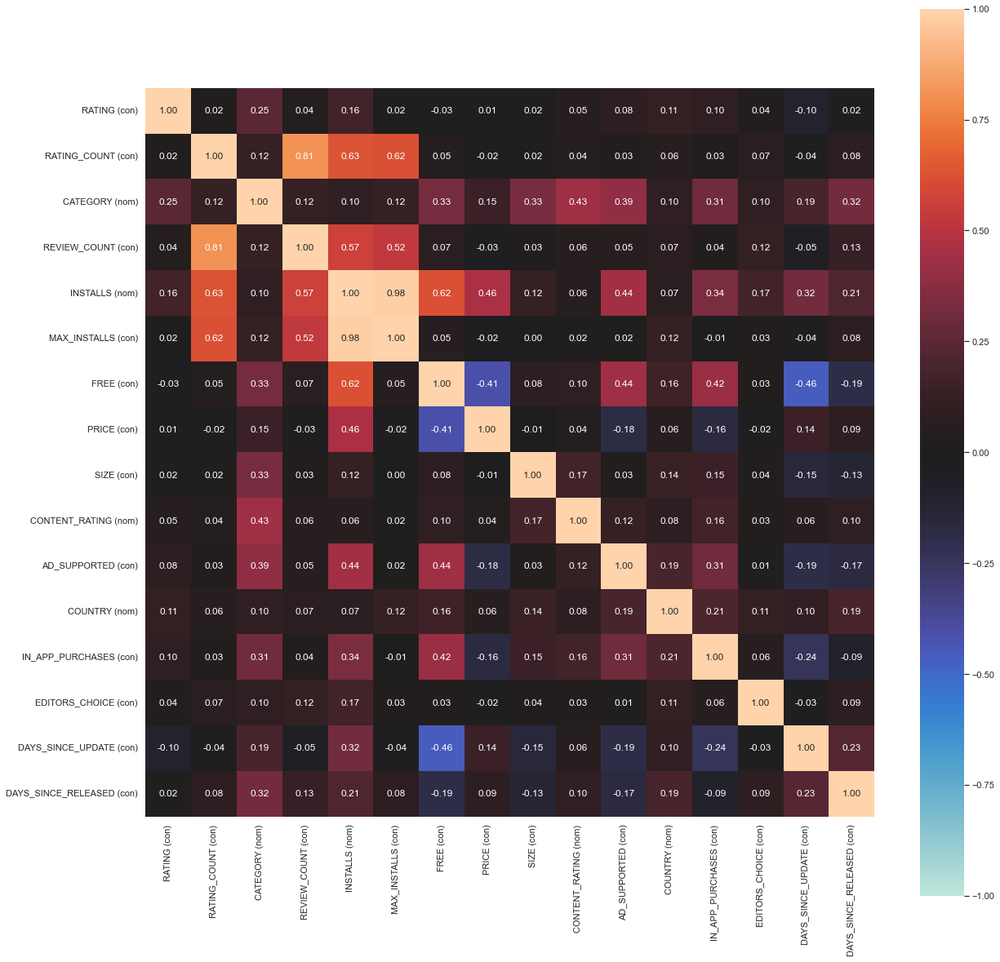

In [4]:
jointDf = df_cleaned[['RATING','RATING_COUNT', 'CATEGORY', 'REVIEW_COUNT', 'INSTALLS', 'MAX_INSTALLS', 'FREE', 'PRICE', 'SIZE', 'CONTENT_RATING', 'AD_SUPPORTED', 'COUNTRY', 'IN_APP_PURCHASES', 'EDITORS_CHOICE', 'DAYS_SINCE_UPDATE', 'DAYS_SINCE_RELEASED']]
nominal.associations(jointDf, figsize = (20, 20), mark_columns=True);


Dython will automatically find which features are categorical and which are numerical, compute a relevant measure of association between each and every feature, and plot it all as an easy-to-read heat-map. <br>
It will then calculate the correlation/strength-of-association of features in data-set with both categorical and continuous features.

### Find outliers function
#### The function below will find the number of outliers and the upper and lower limit. And remove those outliers and return the new dataframe. 
#### The second function does the same thing but it will take in 2 fields.

In [5]:
def Outliers(frame, col):
    Q1 = frame[col].quantile(0.25)
    Q3 = frame[col].quantile(0.75)
    IQR = Q3-Q1
    upp_lim = Q3 + 1.5*IQR
    low_lim = Q1 - 1.5*IQR    
    count = 0
    for x in frame[col]:
        if ((x > upp_lim) or (x < low_lim)): count += 1;
    print(f"There is {count} outliers in \"{col}\" field.")
    print(f"{col} upper limit: ", upp_lim)
    print(f"{col} lower limit: ", low_lim)
    return frame[frame[col] < upp_lim]

def Outliers2(frame, col1, col2):
    Q1a = frame[col1].quantile(0.25)
    Q3a = frame[col1].quantile(0.75)
    IQRa = Q3a-Q1a
    upp_lim1 = Q3a + 1.5*IQRa
    low_lim1 = Q1a - 1.5*IQRa    
    count1 = 0
    for x in frame[col1]:
        if ((x > upp_lim1) or (x < low_lim1)): count1 += 1;
    print(f"There is {count1} outliers in \"{col1}\" field.")
    print(f"{col1} upper limit: ", upp_lim1)
    print(f"{col1} lower limit: ", low_lim1)
    
    Q1b = frame[col2].quantile(0.25)
    Q3b = frame[col2].quantile(0.75)
    IQRb = Q3b-Q1b
    upp_lim2 = Q3b + 1.5*IQRb
    low_lim2 = Q1b - 1.5*IQRb    
    count2 = 0
    for x in frame[col2]:
        if ((x > upp_lim2) or (x < low_lim2)): count2 += 1;
    print(f"There is {count2} outliers in \"{col2}\" field.")
    print(f"{col2} upper limit: ", upp_lim2)
    print(f"{col2} lower limit: ", low_lim2)
    return frame[(frame[col1] < upp_lim1) & (frame[col2] < upp_lim2)]

<a id = 'rating EDA'></a>
## `RATING` EDA

### What is Google Play Store's rating distribution?
### What kind of rating will an app get?

The average rating of an app is:  4.158705050741056


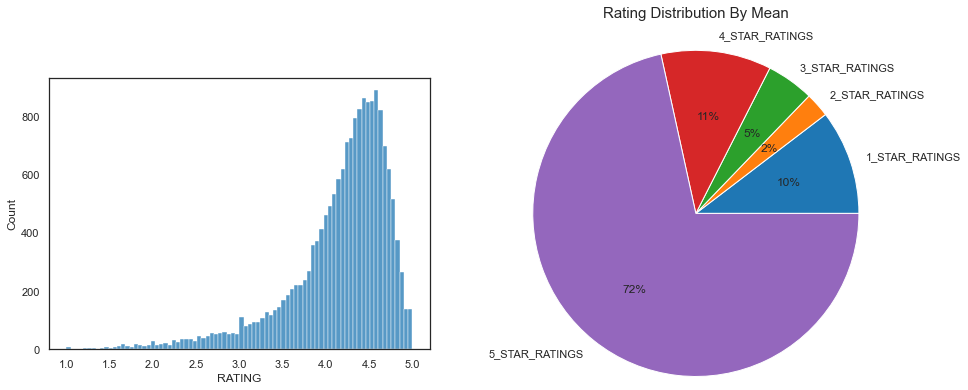

In [6]:
fig, axes =  plt.subplots(1, 2, figsize = (15, 5))

f = sb.histplot(df_cleaned, x = "RATING", ax = axes[0], )
print("The average rating of an app is: ", df_cleaned['RATING'].mean())

ratings = df_cleaned[['1_STAR_RATINGS','2_STAR_RATINGS','3_STAR_RATINGS','4_STAR_RATINGS','5_STAR_RATINGS']]
rating_count = pd.DataFrame(ratings.mean(axis=0))
rating_count.columns = ['Mean']
rating_count.reset_index(inplace=True)

axes[1] = plt.pie(rating_count['Mean'], labels = rating_count['index'], autopct='%.0f%%', radius = 1.5)
plt.title("Rating Distribution By Mean",pad=60, fontsize = 15)
plt.show()


It seems that many people would vote 5 star for an app, making the distribution of number of stars very unbalance.
Also, the distribution of the ratings is negatively skewed.

### `RATING` VS `EDITORS_CHOICE`

In [7]:
fig = px.box(df_cleaned, x = "RATING", color = "EDITORS_CHOICE", title = "RATING VS EDITORS_CHOICE", width=600, height=400)
fig.show()

It seems like we can be confident that those with rating < 3 are not editor's choice. But from rating > 4 onwards, we can't make accurate prediction from what we have now. 

### `RATING` VS `FREE`


What's the distribution of free apps and paid apps?

In [8]:
print("Difference between the number of free and paid apps is",
      len(df_cleaned[df_cleaned['FREE'] == True])-len(df_cleaned[df_cleaned['FREE'] == False]))
fig1 = go.Histogram(x = df_cleaned["FREE"], )
fig2 = go.Box(x = df_cleaned["RATING"], y = df_cleaned["FREE"], orientation = "h")
fig = make_subplots(rows = 2, cols = 1, subplot_titles=("Number of Free And Paid Apps", "Box Plot of 'FREE' VS Rating"))
fig.add_trace(fig1, row=1, col=1)
fig.add_trace(fig2, row=2, col=1)
fig.update_layout(
    width=600,
    height=500
)

Difference between the number of free and paid apps is 10361


### `RATING` VS `AD_SUPPORTED`

In [9]:
fig1 = go.Histogram(x = df_cleaned["AD_SUPPORTED"])
fig2 = go.Box(x = df_cleaned["RATING"], y = df_cleaned["AD_SUPPORTED"], orientation = "h")
fig = make_subplots(rows = 2, cols = 1, subplot_titles=("Number of Apps With Advertisement Supported",
                                                        "Box Plot of Ads Supported VS Rating"))
fig.add_trace(fig1, row=1, col=1)
fig.add_trace(fig2, row=2, col=1)
fig.update_layout(
    width=600,
    height=500
)

Suprisingly, the distribution between these 2 are very even, and it's beneficial to our machine learning later.

### `RATING` VS `CONTENT_RATING` 

In [10]:
print(df_cleaned["CONTENT_RATING"].value_counts())
fig1 = go.Histogram(x = df_cleaned["CONTENT_RATING"])
fig2 = go.Box(x = df_cleaned["RATING"], y = df_cleaned["CONTENT_RATING"], orientation = "h")
fig = make_subplots(rows = 2, cols = 1,subplot_titles=("Distribution In Content Rating", "Box Plot of Content Rating VS Rating"))
fig.add_trace(fig1, row=1, col=1)
fig.add_trace(fig2, row=2, col=1)
fig.update_layout(
    width=600,
    height=500
)

Everyone           12674
Teen                2932
Everyone 10+         988
Mature 17+           854
Adults only 18+       27
Name: CONTENT_RATING, dtype: int64


There's a obvious concentration of the app's rating that are for adults only. As for the apps that are for everyone, it's spread out widely across the rating spectrum. 

### `RATING` VS `IN_APP_PURCHASES`

In [11]:
edited_df = Outliers(df_cleaned, "MAX_INSTALLS")
fig1 = go.Histogram(x = edited_df["IN_APP_PURCHASES"])
fig2 = go.Box(x = edited_df["RATING"], y = edited_df["IN_APP_PURCHASES"], orientation = "h")
fig = make_subplots(rows = 2, cols = 1, subplot_titles=("Number of In-App-Purchases", "Box Plot of In-App-Purchases VS Rating"))
fig.add_trace(fig1, row=1, col=1)
fig.add_trace(fig2, row=2, col=1)
fig.update_layout(
    width=600,
    height=500
)

There is 2694 outliers in "MAX_INSTALLS" field.
MAX_INSTALLS upper limit:  14807107.25
MAX_INSTALLS lower limit:  -8781102.75


### `RATING` VS `DAYS_SINCE_UPDATE`

In [12]:
fig1 = go.Box(x = df_cleaned["DAYS_SINCE_UPDATE"], orientation = "h")
fig2 = go.Histogram(x = df_cleaned["DAYS_SINCE_UPDATE"])
fig = make_subplots(rows = 2, cols = 1, subplot_titles=("Box Plot of 'Days Since Update' and Rating", 
                                                       "Distribution of Days Since Last Update of Apps"))
fig.add_trace(fig1, row=1, col=1)
fig.add_trace(fig2, row=2, col=1)
fig.update_layout(
    width=600,
    height=500
)

You might think this is a very skewed data. But in fact, it's very logical. Because apps should be updated frequently, hence the "lower days" section will be more crowded. BUT!
Let's remove the outliers~

In [13]:
edited_df = Outliers(df_cleaned, "DAYS_SINCE_UPDATE")

There is 2458 outliers in "DAYS_SINCE_UPDATE" field.
DAYS_SINCE_UPDATE upper limit:  423.5
DAYS_SINCE_UPDATE lower limit:  -236.5


Text(0.5, 0.98, 'Rating VS Days Since Update')

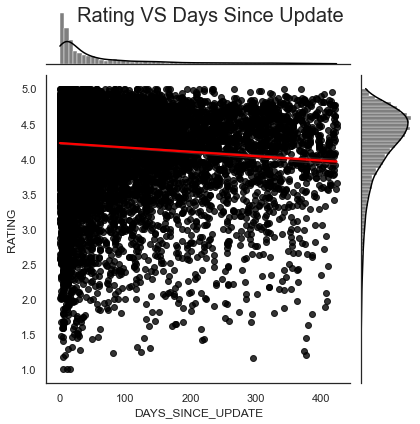

In [14]:
jointDf = edited_df[['DAYS_SINCE_UPDATE', 'RATING']]
sb.jointplot(data = jointDf, x="DAYS_SINCE_UPDATE", y="RATING", kind="reg", color = 'black', line_kws={"color": "red"})
plt.suptitle("Rating VS Days Since Update",size = 20)

This means that if the longer it took since the last update, we are expecting the app to have a lower rating due to low maintenance of the app.

### `RATING` VS `REVIEW_COUNT`


There is 2723 outliers in "REVIEW_COUNT" field.
REVIEW_COUNT upper limit:  8073.75
REVIEW_COUNT lower limit:  -4732.25


Text(0, 0.5, 'Frequency')

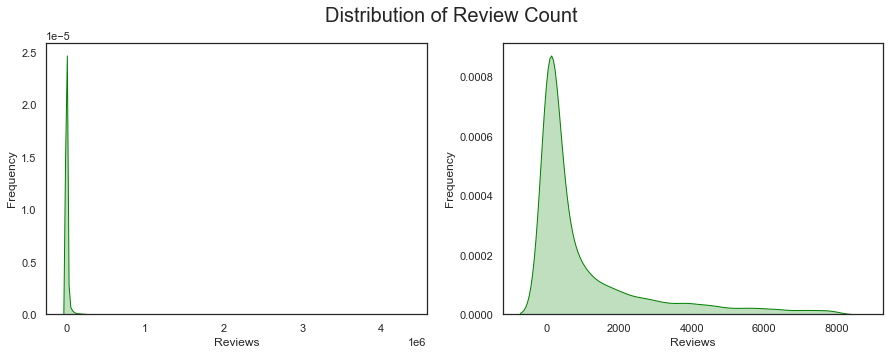

In [15]:
fig, axes =  plt.subplots(1, 2, figsize = (15, 5))
fig.suptitle('Distribution of Review Count', size = 20)

f = sb.kdeplot(df_cleaned['REVIEW_COUNT'], color="Green", shade = True, ax = axes[0])
f.set_xlabel("Reviews")
f.set_ylabel("Frequency")

edited_df = Outliers(df_cleaned, "REVIEW_COUNT")
f = sb.kdeplot(edited_df['REVIEW_COUNT'], color="Green", shade = True, ax = axes[1])
f.set_xlabel("Reviews")
f.set_ylabel("Frequency")

The left graph is before removing the outliers, the right graph is less skewed because we removed the outliers.

Text(0.5, 1.0, 'Rating VS Reviews Count')

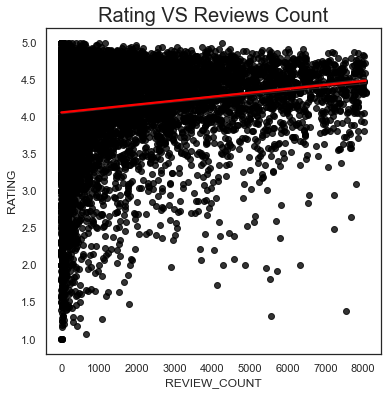

In [16]:
plt.figure(figsize = (6, 6))
sb.regplot(x="REVIEW_COUNT", y="RATING", color = 'black', data=edited_df, line_kws={"color":"red"});
plt.title('Rating VS Reviews Count', size = 20)

### `RATING` VS `SIZE`


In [17]:
def num_plots(df, col, title, xlabel):
    fig, ax = plt.subplots(2, 1, sharex=True, figsize=(12,5),gridspec_kw={"height_ratios": (.2, .8)})
    ax[0].set_title(title,fontsize=18)
    sb.boxplot(x=col, data=df, ax=ax[0])
    ax[0].set(yticks=[])
    sb.histplot(x=col, data=df, ax=ax[1], bins = 50)
    ax[1].set_xlabel(xlabel, fontsize=16)
    plt.tight_layout()
    plt.show()

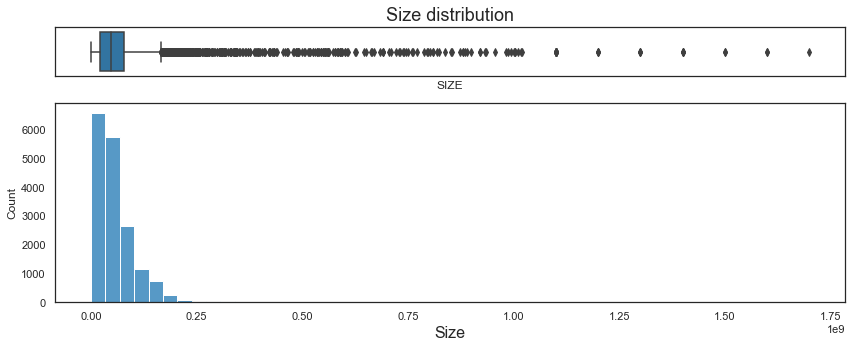

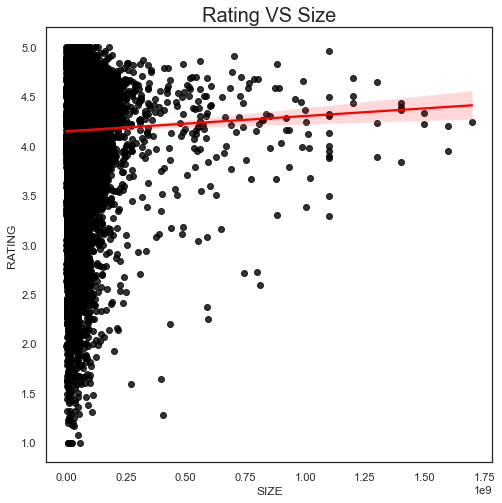

In [18]:
num_plots(df_cleaned, 'SIZE', 'Size distribution', 'Size')

plt.figure(figsize = (8, 8))
sb.regplot(x="SIZE", y="RATING", data=df_cleaned, color = 'black', line_kws={"color":"red"});
plt.title('Rating VS Size',size = 20)
plt.show()

Remove outliers.

In [19]:
edited_df = Outliers(df_cleaned, "SIZE")

There is 692 outliers in "SIZE" field.
SIZE upper limit:  165000000.0
SIZE lower limit:  -67000000.0


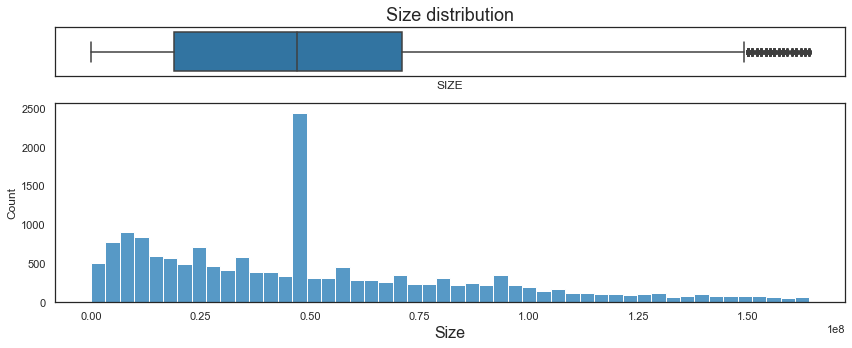

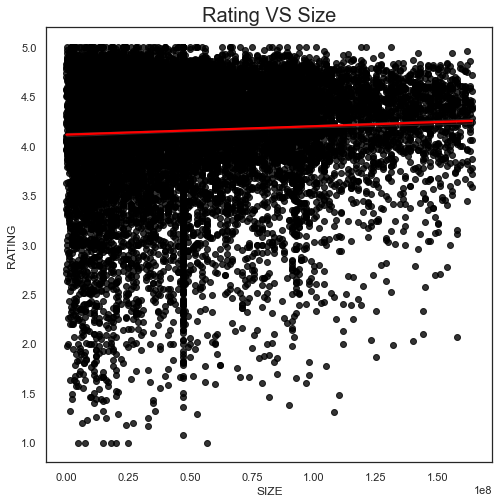

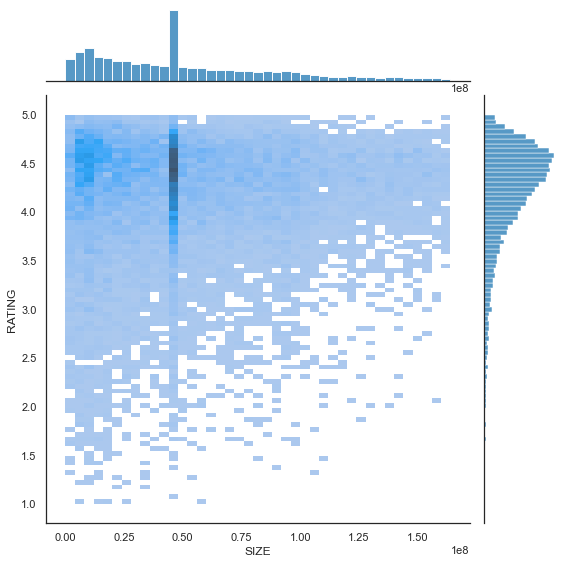

In [20]:
num_plots(edited_df, 'SIZE', 'Size distribution', 'Size')

plt.figure(figsize = (8, 8))
sb.regplot(x="SIZE", y="RATING", data=edited_df, color = 'black', line_kws={"color":"red"});
plt.title('Rating VS Size', size = 20)

sb.jointplot(data = edited_df, x = "SIZE", y = "RATING", height = 8, kind = "hist")

plt.show()

In this dataset, we have the most frequent data are those around 50 MB and it's rated around 4.50.

### `RATING` VS `PRICE`

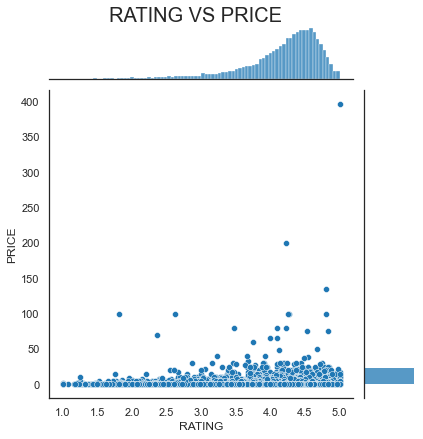

In [21]:
jointDF2 = df_cleaned[["RATING", "PRICE"]]
f = sb.jointplot(data = jointDF2, x = "RATING", y = "PRICE", height = 6)
plt.title("RATING VS PRICE", y=1.2, x=-3.2, size = 20)
plt.show()

Let's observe closely to the distribution within price < 50

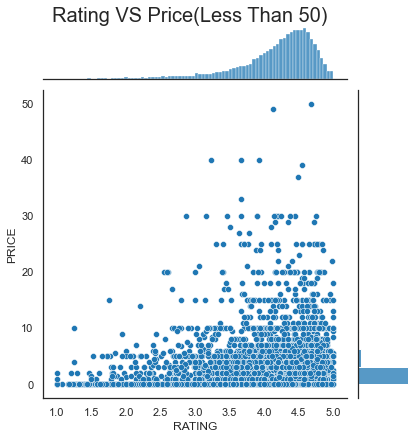

In [22]:
price_less_than_50 = df_cleaned[df_cleaned["PRICE"] < 50]
f = sb.jointplot(data = price_less_than_50, y = "PRICE", x = "RATING", height=6)
plt.title('Rating VS Price(Less Than 50)', y=1.2, x=-3.2, size = 20)
plt.show()

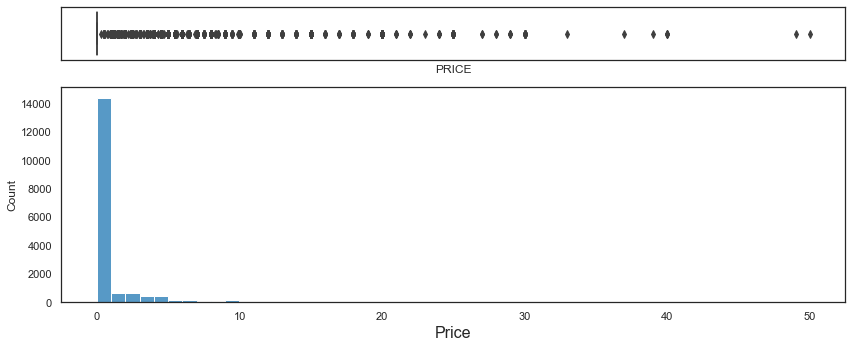

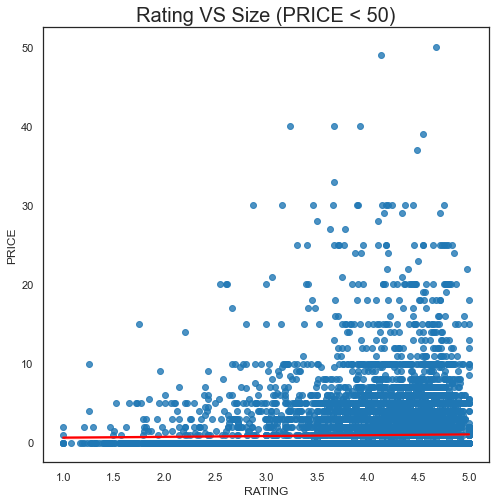

In [23]:
num_plots(price_less_than_50, "PRICE", "", "Price")
temp = df_cleaned[df_cleaned["PRICE"] < 50]
plt.figure(figsize = (8, 8))
sb.regplot(y = "PRICE", x = "RATING", data = temp, line_kws={"color": "red"})
plt.title('Rating VS Size (PRICE < 50)',size = 20)

plt.show()

Now, we have a closer look of the relation between price and rating. It seems that apps that have a higher price also tend to have a slightly higher rating.

<a id = 'installs EDA'></a>
## `INSTALLS` EDA

There are quite a handful of categories in the `INSTALLS` column, we will convert them into less categories.

In [24]:
df_cleaned['INSTALLS_GROUP'] = 'More than 10M'
df_cleaned.loc[(df_cleaned['INSTALLS'] == '1+') | (df_cleaned['INSTALLS'] == '10+') | (df_cleaned['INSTALLS'] == '50+') | 
       (df_cleaned['INSTALLS'] == '100+') | (df_cleaned['INSTALLS'] == '500+' ) | (df_cleaned['INSTALLS'] == '1,000+' ) | 
       (df_cleaned['INSTALLS'] == '5,000+' ) | (df_cleaned['INSTALLS'] == '10,000+') | (df_cleaned['INSTALLS'] == '50,000+') | 
       (df_cleaned['INSTALLS'] == '100,000+'),'INSTALLS_GROUP'] = 'Less than 100K'

df_cleaned.loc[(df_cleaned['INSTALLS'] == '500,000+') 
       | (df_cleaned['INSTALLS'] == '1,000,000+')  | (df_cleaned['INSTALLS'] == '5,000,000+') | (df_cleaned['INSTALLS'] == '5,000,000+') | 
       (df_cleaned['INSTALLS'] == '10,000,000+'),'INSTALLS_GROUP'] = 'Between 100K and 10M'
df_cleaned['INSTALLS_GROUP'] .value_counts()

Between 100K and 10M    8498
Less than 100K          7939
More than 10M           1038
Name: INSTALLS_GROUP, dtype: int64

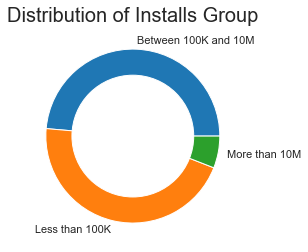

In [25]:
label = ['Between 100K and 10M', 'Less than 100K','More than 10M']
plt.pie(x = df_cleaned['INSTALLS_GROUP'].value_counts().to_frame().INSTALLS_GROUP, labels = label)
my_circle=plt.Circle((0,0), 0.7, color='white')
p=plt.gcf()
p.gca().add_artist(my_circle)
plt.title("Distribution of Installs Group", size =20)
plt.show()

Almost half the number of apps have installs between 100,000 and 10,000,000

### `INSTALLS_GROUP` VS `REVIEW_COUNT`

In [26]:
temp = Outliers(df_cleaned, "REVIEW_COUNT")

There is 2723 outliers in "REVIEW_COUNT" field.
REVIEW_COUNT upper limit:  8073.75
REVIEW_COUNT lower limit:  -4732.25


In [27]:
fig1 = go.Box(x = df_cleaned["REVIEW_COUNT"], y = df_cleaned["INSTALLS_GROUP"], orientation = "h")
fig2 = go.Box(x = temp["REVIEW_COUNT"], y = temp["INSTALLS_GROUP"], orientation = "h")
fig = make_subplots(rows = 2, cols = 1, subplot_titles=("Box Plot of Installs Group VS Review Count",
                                                        "Box Plot of Installs Group VS Review Count(Outliers Removed)"))
fig.add_trace(fig1, row=1, col=1)
fig.add_trace(fig2, row=2, col=1)
fig.update_layout(
    width=600,
    height=500
)

There's a significant increase in review count as the apps get more installs. <br> For apps that fall into "More than 100M" reviews, they have better tendency toward the center and are less spread out.<br> Compared to apps that have reviews "between 10K and 1M", the values are scattered across the axis.

### `INSTALLS_GROUP` VS `RATING_COUNT`

In [28]:
temp2 = Outliers(df_cleaned, "RATING_COUNT")

There is 2708 outliers in "RATING_COUNT" field.
RATING_COUNT upper limit:  139502.5
RATING_COUNT lower limit:  -82529.5


In [29]:
fig1 = go.Box(x = df_cleaned["RATING_COUNT"], y = df_cleaned["INSTALLS_GROUP"], orientation = "h")
fig2 = go.Box(x = temp["RATING_COUNT"], y = temp["INSTALLS_GROUP"], orientation = "h")
fig = make_subplots(rows = 2, cols = 1)
fig.add_trace(fig1, row=1, col=1)
fig.add_trace(fig2, row=2, col=1)
fig.update_layout(
    width=600,
    height=500,
    title="INSTALLS_GROUP VS RATING_COUNT"
)

There's also a significant increase in rating count as the apps get more installs. <br> For apps that fall into "More than 10M" rating count, they also have better tendency toward the center and are less spread out.

### `INSTALLS_GROUP` VS `FREE`

Percentage of apps that have advertisement in each install group:
Less than 100K : 57.72 %
Between 100K and 10M : 97.65 %
More than 10M : 100.00 %


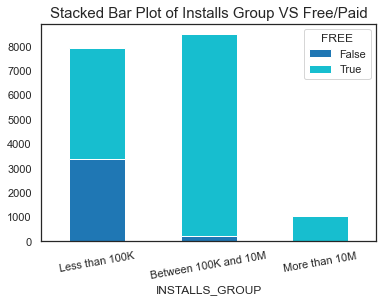

In [30]:
order = ['Less than 100K','Between 100K and 10M','More than 10M']
print('Percentage of apps that have advertisement in each install group:')
for i in order:
    print(i,":","%.2f" %(100*
          len(df_cleaned.loc[(df_cleaned['INSTALLS_GROUP'] == i) & (df_cleaned['FREE'] == True)])/
          (len(df_cleaned.loc[(df_cleaned['INSTALLS_GROUP'] == i) & (df_cleaned['FREE'] == True)])+
           len(df_cleaned.loc[(df_cleaned['INSTALLS_GROUP'] == i) & (df_cleaned['FREE'] == False)]))),"%")
cross_tab2 = pd.crosstab(index=df_cleaned['INSTALLS_GROUP'], columns=df_cleaned['FREE'])
cross_tab2.loc[order].plot(kind='bar', 
                           stacked=True, 
                           colormap='tab10')
plt.xticks(rotation = 10)
plt.title("Stacked Bar Plot of Installs Group VS Free/Paid", size = 15)
plt.show()

Looks like more paid apps are installed less. And those that are popularly installed are free.

### `INSTALLS_GROUP` VS `AD_SUPPORTED`

Percentage of apps that have advertisement in each install group:
Less than 100K : 28.42 %
Between 100K and 10M : 65.69 %
More than 10M : 76.88 %


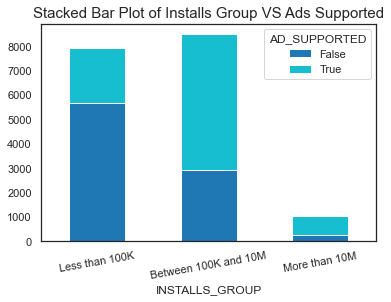

In [31]:
order = ['Less than 100K','Between 100K and 10M','More than 10M']
print('Percentage of apps that have advertisement in each install group:')
for i in order:
    print(i,":","%.2f" %(100*
          len(df_cleaned.loc[(df_cleaned['INSTALLS_GROUP'] == i) & (df_cleaned['AD_SUPPORTED'] == True)])/
          (len(df_cleaned.loc[(df_cleaned['INSTALLS_GROUP'] == i) & (df_cleaned['AD_SUPPORTED'] == True)])+
           len(df_cleaned.loc[(df_cleaned['INSTALLS_GROUP'] == i) & (df_cleaned['AD_SUPPORTED'] == False)]))),"%")
cross_tab2 = pd.crosstab(index=df_cleaned['INSTALLS_GROUP'], columns=df_cleaned['AD_SUPPORTED'])
cross_tab2.loc[order].plot(kind='bar', 
                           stacked=True, 
                           colormap='tab10')
plt.xticks(rotation = 10)
plt.title("Stacked Bar Plot of Installs Group VS Ads Supported", size = 15)
plt.show()

The majority of apps are ad-supported, especially those that are installed more. This might be due to the developer are relying on advertisement as one of their income. 

### `INSTALLS_GROUP` VS `IN_APP_PURCASES`

Percentage of apps that have advertisement in each install group:
Less than 100K : 43.46 %
Between 100K and 10M : 69.51 %
More than 10M : 75.82 %


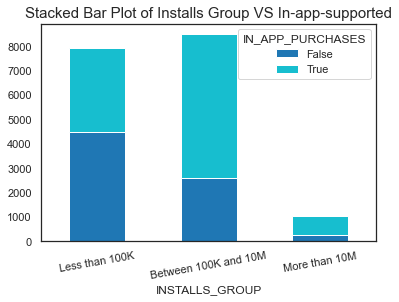

In [32]:
order = ['Less than 100K','Between 100K and 10M','More than 10M']
print('Percentage of apps that have advertisement in each install group:')
for i in order:
    print(i,":","%.2f" %(100*
          len(df_cleaned.loc[(df_cleaned['INSTALLS_GROUP'] == i) & (df_cleaned['IN_APP_PURCHASES'] == True)])/
          (len(df_cleaned.loc[(df_cleaned['INSTALLS_GROUP'] == i) & (df_cleaned['IN_APP_PURCHASES'] == True)])+
           len(df_cleaned.loc[(df_cleaned['INSTALLS_GROUP'] == i) & (df_cleaned['IN_APP_PURCHASES'] == False)]))),"%")
cross_tab2 = pd.crosstab(index=df_cleaned['INSTALLS_GROUP'], columns=df_cleaned['IN_APP_PURCHASES'])
cross_tab2.loc[order].plot(kind='bar', 
                           stacked=True, 
                           colormap='tab10')
plt.xticks(rotation = 10)
plt.title("Stacked Bar Plot of Installs Group VS In-app-supported", size = 15)
plt.show()

It's quite common to have in app purchases for games that are popular. 

<a id = 'miscellaneous EDA'></a>
## Miscellaneous EDA

<a id = 'price EDA'></a>
### `PRICE` EDA

Create categories for `PRICE`


In [33]:
df_cleaned['PRICEBAND'] = "No Price band"
df_cleaned.loc[ df_cleaned['PRICE'] == 0, 'PRICEBAND'] = 'Free'
df_cleaned.loc[(df_cleaned['PRICE'] > 0) & (df_cleaned['PRICE'] <= 4.99), 'PRICEBAND'] = 'cheap'
df_cleaned.loc[(df_cleaned['PRICE'] > 4.99) & (df_cleaned['PRICE'] <= 14.99), 'PRICEBAND']   = 'normal'
df_cleaned.loc[(df_cleaned['PRICE'] > 14.99), 'PRICEBAND']   = 'expensive'
df_cleaned[['PRICEBAND', 'RATING']].groupby(['PRICEBAND']).mean()

,RATING
PRICEBAND,
Free,4.150217
cheap,4.187705
expensive,4.144961
normal,4.217424


In [34]:
fig = px.box(df_cleaned, x = "RATING", color = "PRICEBAND", width=600, height=400,
            title = 'Box Plot of Rating VS Price Band')
fig.show()

<a id = 'category EDA'></a>
### `CATEGORY` EDA

In [35]:
df_cleaned["CATEGORY"].unique()

array(['Lifestyle', 'Puzzle', 'Racing', 'Role Playing', 'Dating',
       'Beauty', 'Books & Reference', 'Video Players & Editors', 'Tools',
       'Communication', 'Simulation', 'Trivia', 'Entertainment',
       'Libraries & Demo', 'Personalization', 'Finance', 'Education',
       'News & Magazines', 'Music & Audio', 'Card', 'Travel & Local',
       'Social', 'Medical', 'Strategy', 'Arcade', 'Photography', 'Board',
       'Productivity', 'Weather', 'Health & Fitness', 'Business',
       'Action', 'Comics', 'Events', 'Casual', 'Shopping', 'Parenting',
       'Maps & Navigation', 'Sports', 'House & Home', 'Art & Design',
       'Word', 'Casino', 'Food & Drink', 'Adventure', 'Music',
       'Auto & Vehicles', 'Educational'], dtype=object)

Before we start to analyse `CATEGORY`, there are 17 categories that are considered as games, this info is gotten from the app scraper, we will identify them first.

In [36]:
games_categories = ["Puzzle", "Racing", "Role Playing", "Simulation", "Trivia", "Card", "Strategy", 
                    "Arcade", "Action", "Word", "Casino", "Adventure", "Educational", "Sports", "Board", 
                    "Casual", "Music"]
for i in range(len(df_cleaned)):
    if (df_cleaned.loc[i, "CATEGORY"] in games_categories):
        df_cleaned.loc[i, "CATEGORY"] = "Game"

What are the most populated app in Google PlayStore? How many sports app do we have in this dataset?

In [37]:
fig = px.histogram(df_cleaned, x="CATEGORY", title='Distribution of Category').update_xaxes(categoryorder = "total descending")
fig.update_layout(
    width=600,
    height=500
)
fig.show()

### Performance for each `CATEGORY`

In [38]:
fig = px.box(df_cleaned, x = "RATING", color = "CATEGORY")
fig.update_layout(
    width=600,
    height=600,
    margin=dict(l=20, r=40, t=20, b=20),
    paper_bgcolor="LightSteelBlue",
    title="RATING ACROSS CATEGORY"
)
fig.show()

<a id = 'size EDA'></a>
### `SIZE` EDA

Create categories for `SIZE`

In [39]:
df_cleaned['SIZEBAND'] = "No size band"
df_cleaned.loc[(df_cleaned['SIZE'] <= 25000000), 'SIZEBAND'] = 'small'
df_cleaned.loc[(df_cleaned['SIZE'] > 25000000) & (df_cleaned['SIZE'] <= 100000000), 'SIZEBAND']   = 'medium'
df_cleaned.loc[(df_cleaned['SIZE'] > 100000000), "SIZEBAND"] = 'large'
# df_cleaned[['SIZEBAND', 'RATING']].groupby(['SIZEBAND']).mean()

df_cleaned["SIZEBAND"].value_counts()

medium    9620
small     5227
large     2628
Name: SIZEBAND, dtype: int64

In [40]:
fig = px.box(df_cleaned, x = "RATING", color = "SIZEBAND", width=600, height=400, title="RATING VS SIZEBAND")
fig.show()

It seems that the median of 'RATING' is lower for apps which have very large and very small 'SIZEBAND'. The median increases a small amount when the app has a medium SIZEBAND.

<a id = 'content rating EDA'></a>
### `CONTENT_RATING` EDA

Looking at the distribution of 'CONTENT_RATING'

In [41]:
print(df_cleaned["CONTENT_RATING"].value_counts())
fig = px.histogram(df_cleaned, x = "CONTENT_RATING", title = "DISTRIBUTION OF CONTENT RATING")
fig.show()

Everyone           12674
Teen                2932
Everyone 10+         988
Mature 17+           854
Adults only 18+       27
Name: CONTENT_RATING, dtype: int64


The distribution of content rating is quite unbalance here. Most of the apps belong to the 'everyone' category and only a few apps are subjected to age restrictions.

<a id='singapore EDA'></a>
# Singapore EDA

In [42]:
sg = df_cleaned.loc[df_cleaned['COUNTRY'] == 'Singapore']
sg

,APP_NAME,RATING,CATEGORY,RATING_COUNT,1_STAR_RATINGS,2_STAR_RATINGS,3_STAR_RATINGS,4_STAR_RATINGS,5_STAR_RATINGS,REVIEW_COUNT,INSTALLS,MAX_INSTALLS,FREE,PRICE,SIZE,DEVELOPER,DEVELOPER_ADDRESS,COUNTRY,CONTENT_RATING,AD_SUPPORTED,IN_APP_PURCHASES,EDITORS_CHOICE,DAYS_SINCE_UPDATE,DAYS_SINCE_RELEASED,INSTALLS_GROUP,PRICEBAND,SIZEBAND
36,1942 🚀 Free classic shooting games,4.587898,Game,73531,3418,1592,3184,5478,59859,5305.0,"5,000,000+",8991266,True,0.0,47000000.0,OneSoft Global PTE. LTD.,"470 NORTH BRIDGE ROAD, SINGAPORE",Singapore,Everyone,True,True,False,488.0,1461.0,Between 100K and 10M,Free,medium
37,1945 Air Force: Airplane games,4.698587,Game,1952163,48977,19288,61575,211427,1610896,34945.0,"100,000,000+",112131352,True,0.0,190000000.0,ONESOFT,"470 NORTH BRIDGE ROAD, SINGAPORE",Singapore,Everyone 10+,True,True,False,10.0,1099.0,More than 10M,Free,large
72,2nd phone number - call & sms,3.250000,Communication,13226,5031,648,0,1048,6499,264.0,"1,000,000+",4492802,True,0.0,24000000.0,High-quality Internet call,"10 Eunos Road 8, 01-123",Singapore,Everyone,True,True,False,112.0,949.0,Between 100K and 10M,Free,small
118,456 Survival Challenge,4.197674,Game,70831,8599,2741,4022,6131,49338,655.0,"10,000,000+",18331140,True,0.0,57000000.0,Azura Global,"Pulau Tekong, Singapore",Singapore,Teen,True,False,False,99.0,144.0,Between 100K and 10M,Free,medium
123,4Fun Lite - Live Chat Room,4.100000,Social,40144,7953,0,757,2272,29162,74.0,"10,000,000+",14874675,True,0.0,79000000.0,SpreadFun,3 FRASER STREET， 05-25，DUO TOWER，SINGAPORE,Singapore,Mature 17+,True,True,False,15.0,592.0,Between 100K and 10M,Free,medium
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16461,Word Connect - Fun Word Game,4.739130,Game,6647,95,30,111,1027,5384,1657.0,"100,000+",408445,True,0.0,25000000.0,Classic Puzzzle Games Studio,164 Canberra Drive The Brownstone 768001,Singapore,Everyone,True,False,False,5.0,448.0,Less than 100K,Free,small
16849,Yugto,4.630769,Books & Reference,53165,1227,395,3057,7363,41123,430.0,"1,000,000+",4100184,True,0.0,26000000.0,Dreame Media,"11 WOODLANDS CLOSE 08-20, SINGAPORE",Singapore,Teen,False,True,False,84.0,461.0,Between 100K and 10M,Free,medium
16931,Zombie War Idle Defense Game,4.448276,Game,38747,3435,1145,1336,1527,31304,591.0,"5,000,000+",7033818,True,0.0,131000000.0,OneSoft Global PTE. LTD.,"470 NORTH BRIDGE ROAD, SINGAPORE",Singapore,Everyone 10+,True,True,False,4.0,467.0,Between 100K and 10M,Free,large
17131,"iQIYI-Drama, Anime, Show",4.456103,Entertainment,829479,82545,15040,18621,38139,675134,2913.0,"50,000,000+",52838429,True,0.0,47000000.0,iQIYI,"6 SHENTON WAY, 33-00, OUE DOWNTOWN, SINGAPORE",Singapore,Everyone,True,True,False,7.0,1020.0,More than 10M,Free,medium


In [43]:
print("Number of games in Singapore:",len(sg))
print("Number of developers in Singapore:",len(sg["DEVELOPER"].unique()))

Number of games in Singapore: 204
Number of developers in Singapore: 106


It seems like there are developers that created more than one app. Let's find out which developer has the most number of apps developed.

In [44]:
temp = sg.groupby(['DEVELOPER']).size().reset_index(name='COUNT').sort_values(by = 'COUNT', ascending = False)
temp

,DEVELOPER,COUNT
3,AMANOTES PTE LTD,17
61,OneSoft Global PTE. LTD.,14
48,LIHUHU PTE. LTD.,11
23,Dreame Media,8
14,Century Games Pte. Ltd.,7
...,...,...
55,Mods for Minecraft PE by Arata Kenshin,1
54,Modo Global,1
1,ACNGames,1
17,Commandoo Jsc,1


Let's choose the top 20 apps by rating and installs in Singapore.<br>
First, we sort the singapore dataset by installation count and rating.<br>
Then, we take the top 20.

In [45]:
sg_top_20_rated = sg.sort_values(["MAX_INSTALLS", "RATING"], ascending = False)
sg_top_20_rated = sg_top_20_rated.head(20)
sg_top_20_rated

,APP_NAME,RATING,CATEGORY,RATING_COUNT,1_STAR_RATINGS,2_STAR_RATINGS,3_STAR_RATINGS,4_STAR_RATINGS,5_STAR_RATINGS,REVIEW_COUNT,INSTALLS,MAX_INSTALLS,FREE,PRICE,SIZE,DEVELOPER,DEVELOPER_ADDRESS,COUNTRY,CONTENT_RATING,AD_SUPPORTED,IN_APP_PURCHASES,EDITORS_CHOICE,DAYS_SINCE_UPDATE,DAYS_SINCE_RELEASED,INSTALLS_GROUP,PRICEBAND,SIZEBAND
12467,SHAREit: Share & File Manager,4.156039,Tools,16968065,2637001,496300,690263,902531,12241970,50315.0,"1,000,000,000+",1810333419,True,0.0,51000000.0,Smart Media4U Technology Pte.Ltd.,2 VENTURE DRIVE 11-30 VISION EXCHANGE SINGAPO...,Singapore,Everyone,True,False,False,1.0,3236.0,More than 10M,Free,medium
5859,Garena Free Fire - Illuminate,3.921184,Game,106026036,23983506,2183863,3267671,5361237,71229759,529596.0,"1,000,000,000+",1183906520,True,0.0,47000000.0,Garena International I,"1 FUSIONOPOLIS PLACE, 17-10, GALAXIS, Singapore",Singapore,Mature 17+,False,True,False,27.0,1552.0,More than 10M,Free,medium
10585,PUBG MOBILE: Aftermath,4.100963,Game,41487245,7662453,839604,1185157,1759589,30040442,795148.0,"500,000,000+",600285723,True,0.0,47000000.0,Level Infinite,10 ANSON ROAD 21-07 INTERNATIONAL PLAZA SING...,Singapore,Teen,True,True,True,55.0,1450.0,More than 10M,Free,medium
8610,Magic Tiles 3,3.935281,Game,2832992,447567,142573,222086,354141,1666625,95367.0,"100,000,000+",484629075,True,0.0,47000000.0,AMANOTES PTE LTD,"24-09 SBF Center, 160 Robinson Road, Singapor...",Singapore,Everyone,True,True,False,11.0,1838.0,More than 10M,Free,medium
14803,Tiles Hop: EDM Rush!,4.168087,Game,3011736,372687,115026,176130,317346,2030547,77783.0,"100,000,000+",448568681,True,0.0,108000000.0,AMANOTES PTE LTD,"24-09 SBF Center, 160 Robinson Road, Singapor...",Singapore,Teen,True,True,False,17.0,1512.0,More than 10M,Free,large
1497,BeautyPlus-Snap Retouch Filter,4.486657,Photography,4814223,354636,91863,164567,447883,3755274,30405.0,"100,000,000+",430106338,True,0.0,219000000.0,PIXOCIAL TECHNOLOGY (SINGAPORE) PTE. LTD.,"80 Robinson Road 02-00, Singapore 068898",Singapore,Everyone,True,True,False,4.0,3159.0,More than 10M,Free,large
15953,"WPS Office-PDF,Word,Excel,PPT",4.315896,Productivity,3742522,355120,95942,204036,443825,2643599,56023.0,"100,000,000+",428810135,True,0.0,126000000.0,WPS SOFTWARE PTE. LTD.,6 RAFFLES QUAY 14-06 SINGAPORE,Singapore,Everyone,True,True,False,11.0,3883.0,More than 10M,Free,large
16115,WeChat,3.748641,Communication,6103916,1400688,216129,380447,626143,3480509,212964.0,"100,000,000+",366352173,True,0.0,396000000.0,WeChat International Pte. Ltd.,"10 Anson Rd, 21-07, International Plaza, Sing...",Singapore,Everyone,False,True,False,11.0,4055.0,More than 10M,Free,large
10559,PLAYit-All in One Video Player,4.642533,Video Players & Editors,3729916,174007,52639,112895,253109,3137266,13610.0,"100,000,000+",265228236,True,0.0,28000000.0,PLAYIT TECHNOLOGY PTE. LTD.,"60 PAYA LEBAR ROAD, 08-10,PAYA LEBAR SQUARE, S...",Singapore,Everyone,True,True,False,11.0,851.0,More than 10M,Free,medium
6444,"Hago-Talk, Live & Play Games",4.256812,Social,6045675,560542,157685,504453,767615,4055380,6078.0,"100,000,000+",257141759,True,0.0,47000000.0,HAGO,8 TEMASEK BOULEVARD 08-05 SUNTEC TOWER THREE ...,Singapore,Mature 17+,True,True,False,14.0,1267.0,More than 10M,Free,medium


### Singapore Top performing developers
We will determine the reputation of a developer by evaluating their sum of all of their application's max installation count and average rating of each application.

In [46]:
data2 = sg[["APP_NAME", "DEVELOPER", "RATING", "MAX_INSTALLS"]]
avg_rating = data2.groupby(["DEVELOPER"])["RATING"].mean().to_frame()
sum_installs = data2.groupby(["DEVELOPER"])["MAX_INSTALLS"].sum().to_frame()
sg_dev = pd.merge(avg_rating, sum_installs, on = "DEVELOPER")
sg_dev.sort_values(["RATING", "MAX_INSTALLS"], ascending = False).head(10)

,RATING,MAX_INSTALLS
DEVELOPER,,
2021 Yearly Selection Cloud Gaming - Netboom Ltd.,4.888230,19820120
PLAYNEXX GAMES,4.842593,500701
SM Health Team,4.841572,5633058
BOUNCE ENTERTAINMENT COMPANY LIMITED,4.830189,204942
DB RR STUDIO,4.825671,5796815
AlphaPlay Games,4.770000,40542
Wood Puzzle Sudoku Games,4.769841,1226129
Classic Puzzzle Games Studio,4.739130,408445
Rhythm Games Star Studio,4.737864,1372366


<a id='fang EDA'></a>
# FANG EDA

In [47]:
facebook_apps = df_cleaned[df_cleaned["DEVELOPER"] == "Meta Platforms, Inc."]
amazon_apps = df_cleaned[df_cleaned["DEVELOPER"] == "Amazon Mobile LLC"]
netflix_apps = df_cleaned[df_cleaned["DEVELOPER"] == "Netflix, Inc."]
google_apps = df_cleaned[df_cleaned["DEVELOPER"] == "Google LLC"]

FANG = [facebook_apps, amazon_apps, netflix_apps, google_apps]
stringFANG = ["Facebook", "Amazon", "Netflix", "Google"]

### How many apps did each company developed?


In [48]:
print("Facebook has developed", len(facebook_apps), "app(s).")
print("Amazon has developed", len(amazon_apps), "app(s).")
print("Netflix has developed", len(netflix_apps), "app(s).")
print("Google has developed", len(google_apps), "app(s).")

Facebook has developed 10 app(s).
Amazon has developed 17 app(s).
Netflix has developed 4 app(s).
Google has developed 65 app(s).


### How's the app rating for the company?

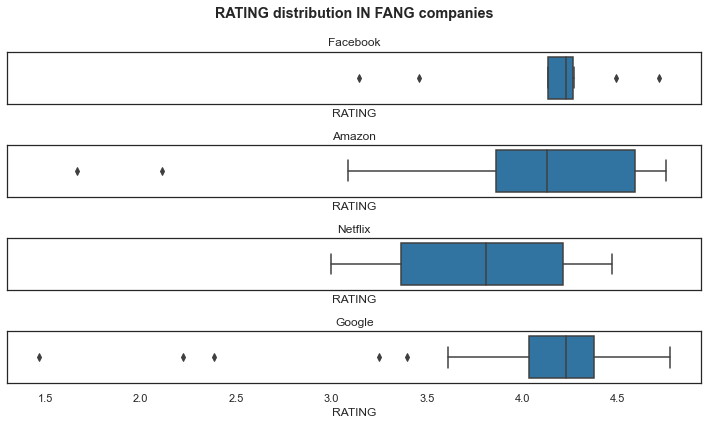

In [49]:
fig, axes = plt.subplots(4, 1, figsize = (10, 6), sharex = True)
x = 0
for i in FANG:
    sb.boxplot(data = i, x = "RATING", ax = axes[x])
    x += 1
x = 0 #reset
for i in stringFANG:
    axes[x].set_title(i)
    x += 1
x = 0 #reset

fig.suptitle('RATING distribution IN FANG companies',fontweight ="bold")
plt.tight_layout()


Facebook's apps have the most concentrated distribution of ratings while Netflix's apps have the lowest median. <br>
Amazon and Google both have one app each with rating lower than two, let's take a look at what apps could it be.

### What kind of apps do such great company develop?

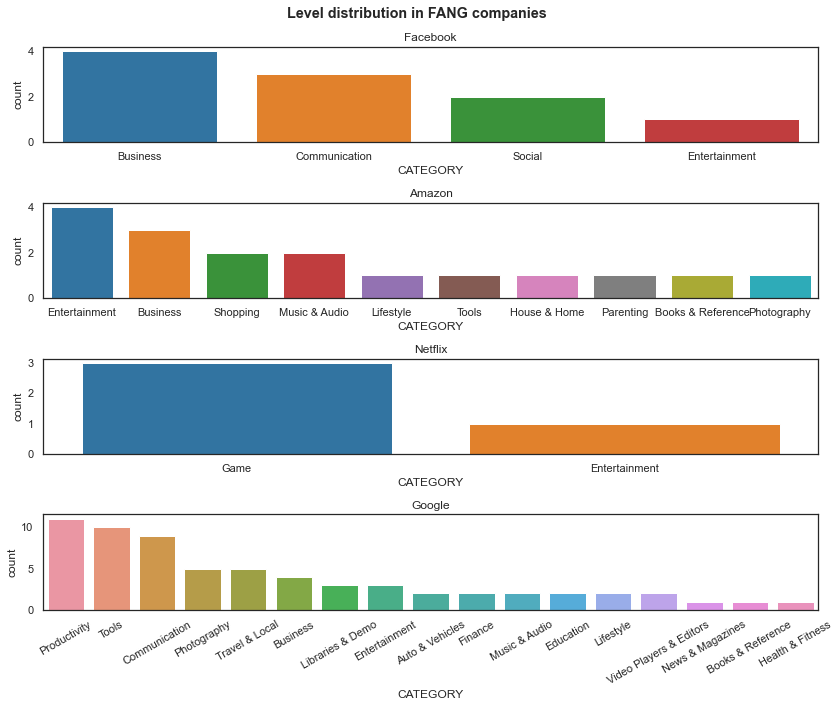

In [50]:
fig, axes = plt.subplots(4, 1, figsize = (12, 10))
x = 0
for i in FANG:
    sb.countplot(x = "CATEGORY", data = i, ax = axes[x] , order = i["CATEGORY"].value_counts().index)
    if (x == 3):
        plt.xticks(rotation = 30)
    x += 1
x = 0 #reset
for i in stringFANG:
    axes[x].set_title(i)
    x += 1
x = 0 #reset
fig.suptitle('Level distribution in FANG companies',fontweight ="bold")
plt.tight_layout()


The first three plots here is a little unintuitive and not expected. <br>
Facebook is well known for social media apps, but it shows that the mode category is business.<br>
Amazon is well known for its shopping platform, but here the mode category is entertainment. <br>
On the other hand, Netflix is well known for movies and series entertainment, but game is the most developed app here.<br>
Maybe we should try plotting this from a different perspective.

### Let's find out how each category did in each company, shall we?

Text(0.5, 1.04, 'Max Installs VS Category of Apps Developed by FANG')

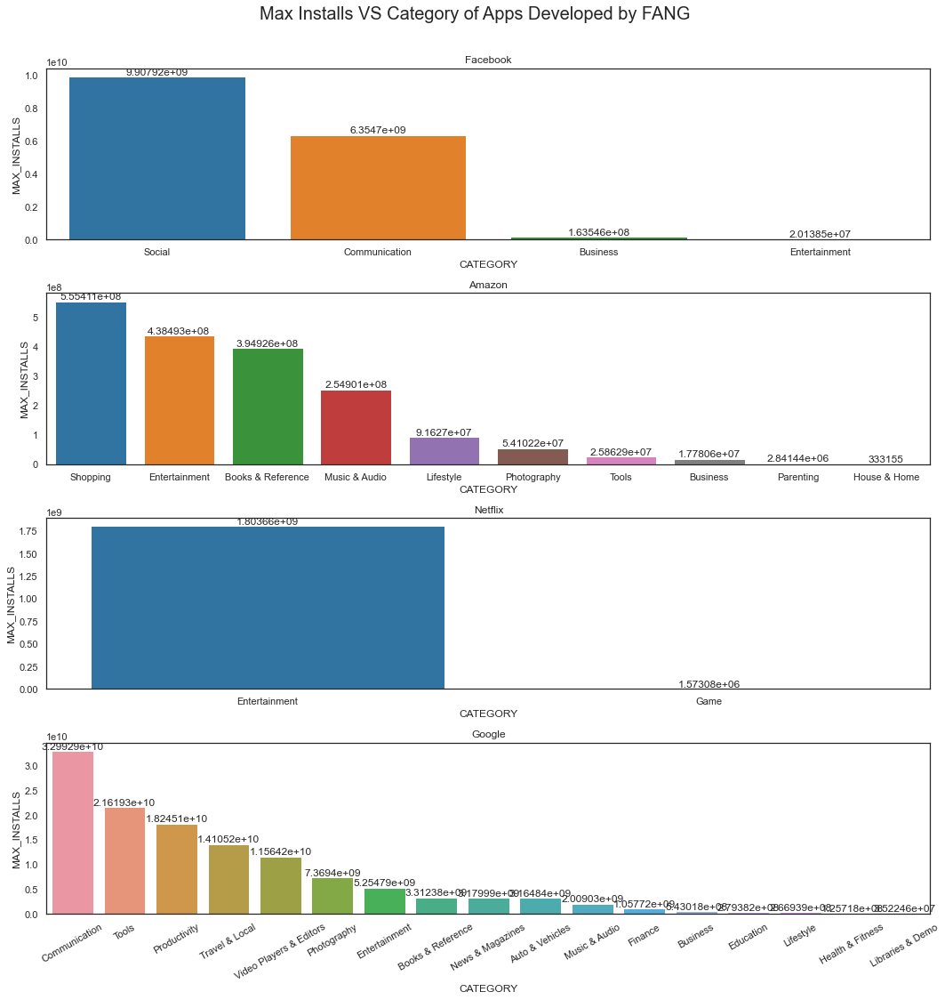

In [51]:
fb2 = facebook_apps.groupby(['CATEGORY'])['MAX_INSTALLS'].sum().reset_index()
amz2 = amazon_apps.groupby(['CATEGORY'])['MAX_INSTALLS'].sum().reset_index()
net2 = netflix_apps.groupby(['CATEGORY'])['MAX_INSTALLS'].sum().reset_index()
goog2 = google_apps.groupby(['CATEGORY'])['MAX_INSTALLS'].sum().reset_index()
FANG2 = [fb2, amz2, net2, goog2]

fig, axes = plt.subplots(4, 1, figsize = (15, 15))
x = 0
for i in FANG2:
    ax = sb.barplot(x = "CATEGORY", y = 'MAX_INSTALLS', data = i, ax = axes[x] , order = i.sort_values('MAX_INSTALLS', ascending = False).CATEGORY)
    ax.bar_label(ax.containers[0])
    if (x == 3):
        plt.xticks(rotation = 30)
    x += 1
x = 0 #reset
for i in stringFANG:
    axes[x].set_title(i)
    x += 1
x = 0 #reset
plt.tight_layout()
plt.suptitle("Max Installs VS Category of Apps Developed by FANG", y = 1.04, size = 20)

These plots are much more intuitive now. <br>
In fact, Facebook's most well-known app falls under the 'Social' category because Facebook is a social media platform. <br>
And Amazon is a e-shopping platform while Netflix is an entertainment platform.<br>Google is the leading platform in tools, productivity and communication.

<a id ='geospatial analysis'></a>
# Geospatial Analysis
We will use the same dataset but will drop those rows without values in the COUNTRY column.

In [52]:
df_country = df_cleaned.dropna(subset=['COUNTRY'])
df_country.reset_index(drop= True, inplace=True)
df_country.shape

(4840, 27)

In [53]:
df_country[df_country["COUNTRY"] == "Luxembourg"]

,APP_NAME,RATING,CATEGORY,RATING_COUNT,1_STAR_RATINGS,2_STAR_RATINGS,3_STAR_RATINGS,4_STAR_RATINGS,5_STAR_RATINGS,REVIEW_COUNT,INSTALLS,MAX_INSTALLS,FREE,PRICE,SIZE,DEVELOPER,DEVELOPER_ADDRESS,COUNTRY,CONTENT_RATING,AD_SUPPORTED,IN_APP_PURCHASES,EDITORS_CHOICE,DAYS_SINCE_UPDATE,DAYS_SINCE_RELEASED,INSTALLS_GROUP,PRICEBAND,SIZEBAND
3641,Skype,4.132845,Communication,11442600,1529613,400685,670410,1261164,7580728,419372.0,"1,000,000,000+",1874038869,True,0.0,47000000.0,Skype,"Skype Software S.à.r.l, 23 – 29 Rives de Claus...",Luxembourg,Everyone,False,True,True,7.0,4173.0,More than 10M,Free,medium


### 1. Comparing the average of max installs of the apps developed by each country.

In [54]:
max_installs_by_mean = pd.DataFrame(df_country.groupby(["COUNTRY"])["MAX_INSTALLS"].agg("mean"))
max_installs_by_mean.rename(columns={'MAX_INSTALLS': 'MEAN_MAX_INSTALLS'}, inplace = True)
max_installs_by_mean = max_installs_by_mean.nlargest(10,['MEAN_MAX_INSTALLS'])
max_installs_by_mean = max_installs_by_mean.reset_index()
max_installs_by_mean

,COUNTRY,MEAN_MAX_INSTALLS
0,Luxembourg,1.874039e+09
1,Usa,1.305975e+08
2,Ireland,7.368652e+07
3,South Korea,5.526386e+07
4,Oman,5.204643e+07
5,Singapore,4.980529e+07
6,Switzerland,4.265305e+07
7,Cyprus,3.512464e+07
8,France,2.942811e+07
9,Lithuania,2.183506e+07


In [55]:
sequence = []
for i in range (1000,0,-100):
    sequence.append(i)
max_installs_by_mean['SIZE'] = sequence
max_installs_by_mean
max_installs_by_mean

,COUNTRY,MEAN_MAX_INSTALLS,SIZE
0,Luxembourg,1.874039e+09,1000
1,Usa,1.305975e+08,900
2,Ireland,7.368652e+07,800
3,South Korea,5.526386e+07,700
4,Oman,5.204643e+07,600
5,Singapore,4.980529e+07,500
6,Switzerland,4.265305e+07,400
7,Cyprus,3.512464e+07,300
8,France,2.942811e+07,200
9,Lithuania,2.183506e+07,100


In [56]:
fig = px.bar(max_installs_by_mean, x='COUNTRY', y='MEAN_MAX_INSTALLS')
fig.update_layout(
    width=600,
    height=500,
    title='MEAN_MAX_INSTALLS VS COUNTRY'
)
fig.show()

We have grouped the dataset by country and find their mean of max installs per country. Then we will proceed with picking the top 10 countries. <br>
Usa, South Korea, Singapore, France, Finland, China, Turkey and Hong Kong all remains on the list.

In [57]:
fig = px.scatter_geo(max_installs_by_mean, locations="COUNTRY", 
                     hover_name="COUNTRY", size = 'MEAN_MAX_INSTALLS',locationmode = 'country names')
fig.update_layout({
    'geo': {
        'resolution': 50
    }
})
fig.show()

### 2. Comparing the average rating of the apps developed by each country.
We will do the same thing, but this time we will explore on the rating.

In [58]:
rating_by_mean = pd.DataFrame(df_country.groupby(["COUNTRY"])["RATING"].agg("mean"))
rating_by_mean.rename(columns={'RATING': 'MEAN_RATING'}, inplace = True)

In [59]:
fig = px.box(rating_by_mean, x = "MEAN_RATING",points="all")
fig.update_layout(
    width=600,
    height=500,
    title='MEAN_RATING DISTRIBUTION'
)
fig.show()

This figure gives us 2 types of visualizations, boxplot and swarmplot. Which provide us an insight where the majority of data lies in the rating spectrum. Which is 4 to 4.5. <br>
Notice there's a few outliers that have rating that are lower than 3.5. Let's find out which countries are those.

In [60]:
lowest_mean_rating = rating_by_mean[rating_by_mean['MEAN_RATING'] < 3.5]
lowest_mean_rating

,MEAN_RATING
COUNTRY,
Belize,3.288830
Iceland,3.462838
Morocco,2.936170
Uganda,2.200000


In [61]:
rating_by_mean = rating_by_mean.nlargest(10,['MEAN_RATING'])
rating_by_mean = rating_by_mean.reset_index()
rating_by_mean

,COUNTRY,MEAN_RATING
0,Montenegro,4.800969
1,Moldova,4.742574
2,Venezuela,4.670000
3,Albania,4.633178
4,Costa Rica,4.566433
5,Belarus,4.547344
6,Nepal,4.540000
7,Peru,4.535119
8,Tanzania,4.527273
9,Dominican Republic,4.511111


In [62]:
fig = px.bar(rating_by_mean, x='COUNTRY', y='MEAN_RATING')
fig.update_layout(
    width=600,
    height=500,
    title='MEAN_RATING VS COUNTRY'
)
fig.show()

In [63]:
rating_by_mean = rating_by_mean.nlargest(10,['MEAN_RATING'])
sequence = []
for i in range (1000,0,-100):
    sequence.append(i)
rating_by_mean['SIZE'] = sequence
rating_by_mean


,COUNTRY,MEAN_RATING,SIZE
0,Montenegro,4.800969,1000
1,Moldova,4.742574,900
2,Venezuela,4.670000,800
3,Albania,4.633178,700
4,Costa Rica,4.566433,600
5,Belarus,4.547344,500
6,Nepal,4.540000,400
7,Peru,4.535119,300
8,Tanzania,4.527273,200
9,Dominican Republic,4.511111,100


In [64]:
fig = px.scatter_geo(rating_by_mean, locations="COUNTRY", 
                     hover_name="COUNTRY", hover_data=["MEAN_RATING"], size = 'SIZE',locationmode = 'country names')
fig.update_layout({
    'geo': {
        'resolution': 50
    }
})
fig.show()

Compared to the previous map, this map's bubbles are more consistent and we can clearly see which bubble is bigger. Because we introduced a rank metric called SIZE which will change the bubble size according the ranking of the country instead of the mean ratings. 

In [66]:
# exporting the latest data into a csv file
file_path = "./datasets/google_app_scrap_cleaned2.csv"
df_cleaned.to_csv(path_or_buf=file_path, index=False);